# Business Understanding

The dataset consists out of data for sold houses.

The following features are available:

## id
Shows the unique id of the sold house.
Should not be relevant for the analysis.

## date 
The date of the sale might be interesting, since it is known, that the prices change by times.
Data type is -object-

## bedrooms
Number of bedrooms within the house.

## bathrooms
Number of bathrooms sold within the house. A bathroom that count's less than one means, that it is not fully equipped. For example only a toilet with no shower, this won't count as a full bathroom.

## sqft_living
Squarefeet of the home.

## sqft_lot
Squarefeet of the lot.

## floors
Levels in the house

## waterfront
View to waterfront available.

## view
Quality of view from house.

## condition
The overall condition of the house

## grade
Grade of the house according to a grading system

## sqft_above
The square footage inside the house above the basement

## yr_built
Built year.

## yr_renovated

## zipcode
Postal code. Might be interesting to use this for clustering.

## lat / long
Geographical postition of the house

## sqft_living_15
The square footage of linving space inside the house of the nearest 15 neighbours.

## sqft_lot_15
The square footage of the lot space of the nearest 15 neighbours.




In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
from sklearn.preprocessing import OneHotEncoder
from sklearn import linear_model
from pandas.plotting import scatter_matrix

In [2]:
data = pd.read_csv('King_County_House_prices_dataset.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

# Data Mining

In [4]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [5]:
data.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287
21596,1523300157,10/15/2014,325000.0,2,0.75,1020,1076,2.0,0.0,0.0,...,7,1020,0.0,2008,0.0,98144,47.5941,-122.299,1020,1357


In [6]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


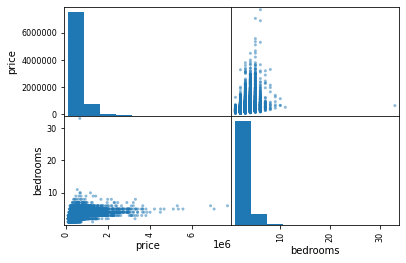

In [7]:
scatter_matrix(data[['price', 'bedrooms']],diagonal='hist');


In [8]:
data.sort_values('price', ascending=False).head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.0,6,8.00,12050,27600,2.5,0.0,3.0,...,13,8570,3480.0,1910,1987.0,98102,47.6298,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.0,5,4.50,10040,37325,2.0,1.0,2.0,...,11,7680,2360.0,1940,2001.0,98004,47.6500,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.0,6,7.75,9890,31374,2.0,0.0,4.0,...,13,8860,1030.0,2001,0.0,98039,47.6305,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.0,5,5.75,9200,35069,2.0,0.0,0.0,...,13,6200,3000.0,2001,NaN,98039,47.6289,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.0,5,5.00,8000,23985,2.0,0.0,4.0,...,12,6720,1280.0,2009,0.0,98004,47.6232,-122.220,4600,21750


In [9]:
data.sort_values('price', ascending=False).tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2139,1623049041,5/8/2014,82500.0,2,1.00,520,22334,1.0,0.0,0.0,...,5,520,0.0,1951,0.0,98168,47.4799,-122.296,1572,10570
8267,3883800011,11/5/2014,82000.0,3,1.00,860,10426,1.0,0.0,0.0,...,6,860,0.0,1954,0.0,98146,47.4987,-122.341,1140,11250
16184,3028200080,3/24/2015,81000.0,2,1.00,730,9975,1.0,NaN,0.0,...,5,730,0.0,1943,0.0,98168,47.4808,-122.315,860,9000
465,8658300340,5/23/2014,80000.0,1,0.75,430,5050,1.0,NaN,0.0,...,4,430,0.0,1912,0.0,98014,47.6499,-121.909,1200,7500
15279,40000362,5/6/2014,78000.0,2,1.00,780,16344,1.0,0.0,0.0,...,5,780,0.0,1942,NaN,98168,47.4739,-122.280,1700,10387


# Data Cleaning

# price

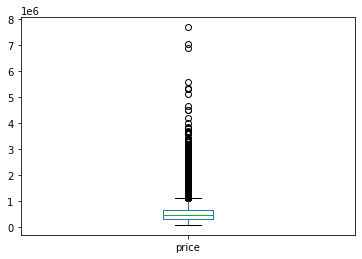

In [10]:
data.price.plot(kind='box');

To be more accurate, everything above the 90th percentile is going to be removed. As the high values are not a good comparison values for the other house sales.

In [11]:
data = data.drop(data[data.price > 900000].index)

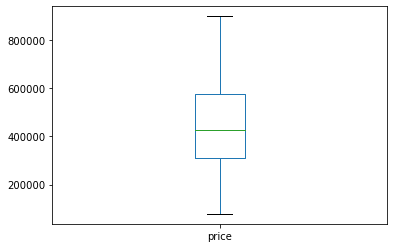

In [12]:
data.price.plot(kind='box');



# Date
The date consinst of a string. But to work with it, it needs to be an integer, and the year must be leading.


In [13]:
data['date'] = pd.to_datetime(data['date']).dt.strftime('%Y-%m-%d')

In [14]:
data['date'].replace('-','',regex=True,inplace=True)

In [15]:
data.date = data.date.astype(int)

In [16]:
data

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,20140521,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,20150223,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,20140623,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,20150116,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


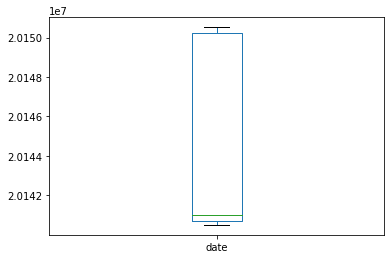

In [17]:
data.date.plot(kind ='box')

In [18]:
data.sort_values('date', ascending=True).head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7954,5101405331,20140502,495000.0,4,1.75,1600,6380,1.0,0.0,0.0,...,8,1130,470.0,1959,NaN,98125,47.7010,-122.306,1090,6380
2578,2591720070,20140502,482000.0,4,2.50,2710,35868,2.0,0.0,0.0,...,9,2710,0.0,1989,0.0,98038,47.3750,-122.022,2780,36224
19550,2423600100,20140502,491500.0,4,1.75,2190,125452,1.0,0.0,2.0,...,9,2190,0.0,1968,0.0,98092,47.2703,-122.069,3000,125017
13095,2025700730,20140502,287200.0,3,3.00,1850,19966,1.0,0.0,0.0,...,7,1090,760.0,1992,0.0,98038,47.3493,-122.034,1410,6715
17388,1868902745,20140502,805000.0,3,2.00,2710,4500,1.5,0.0,0.0,...,8,1880,830.0,1929,0.0,98115,47.6747,-122.295,2060,4500


In [19]:
data.sort_values('date', ascending=True).tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17383,6815100380,20150514,855000.0,3,1.75,1900,4000,1.0,0.0,0.0,...,7,1300,600.0,1965,NaN,98103,47.6854,-122.331,1880,4000
20456,5057100110,20150514,479349.0,5,3.00,3223,6371,2.0,0.0,0.0,...,9,3223,0.0,2014,0.0,98042,47.3584,-122.163,1979,9008
7217,1786200010,20150514,456500.0,4,2.50,2580,11780,2.0,0.0,0.0,...,9,2580,0.0,2003,0.0,98038,47.3658,-122.040,2410,8403
5632,7923600250,20150515,450000.0,5,2.00,1870,7344,1.5,0.0,0.0,...,7,1870,0.0,1960,0.0,98007,47.5951,-122.144,1870,7650
13040,5101400871,20150524,445500.0,2,1.75,1390,6670,1.0,0.0,0.0,...,6,720,670.0,1941,0.0,98115,47.6914,-122.308,920,6380


# Bedrooms

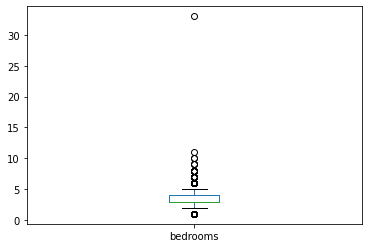

In [20]:
data.bedrooms.plot(kind ='box')

In [21]:
bed5 = data.loc[data['bedrooms'] >= 8]

In [22]:
bed5

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1658,9126101740,20141204,490000.0,8,5.00,2800,2580,2.0,0.0,0.0,...,8,1880,920.0,1997,0.0,98122,47.6086,-122.303,1800,2580
4063,7226500100,20150219,373000.0,8,3.00,2850,12714,1.0,NaN,0.0,...,7,2850,0.0,1959,0.0,98055,47.4859,-122.205,1480,4942
4092,1997200215,20140507,599999.0,9,4.50,3830,6988,2.5,0.0,0.0,...,7,2450,1380.0,1938,0.0,98103,47.6927,-122.338,1460,6291
4231,2902200015,20150106,700000.0,9,3.00,3680,4400,2.0,0.0,0.0,...,7,2830,850.0,1908,0.0,98102,47.6374,-122.324,1960,2450
6168,1873400020,20140703,340000.0,8,2.75,2790,6695,1.0,NaN,0.0,...,7,1470,1320.0,1977,NaN,98133,47.7565,-122.331,1760,7624
8537,424049043,20140811,450000.0,9,7.50,4050,6504,2.0,0.0,0.0,...,7,4050,0.0,1996,0.0,98144,47.5923,-122.301,1448,3866
8748,1773100755,20140821,520000.0,11,3.00,3000,4960,2.0,0.0,0.0,...,7,2400,600.0,1918,1999.0,98106,47.5560,-122.363,1420,4960
9068,6746700615,20150318,700000.0,8,2.50,2280,3000,1.5,0.0,0.0,...,7,1210,1070.0,1911,0.0,98105,47.6675,-122.316,1610,3000
9443,2769600590,20141016,900000.0,8,4.00,4020,7500,1.0,0.0,0.0,...,8,2010,2010.0,1968,0.0,98107,47.6732,-122.363,1560,3737
12872,8813400155,20141219,808000.0,8,3.75,3460,4600,2.0,0.0,0.0,...,7,2860,600.0,1987,0.0,98105,47.6617,-122.289,2170,3750


There are houses with a lot bedrooms. Most of them seem to be reasonable, even they are a lot. But the one with 33 bedrooms doesn't make sense at all. There is only 1620sqft for the 33 bedrooms in one floor. This entry will be removed from the data completly.

In [23]:
indexNames = data[ (data['bedrooms'] == 33) ].index

In [24]:
data.drop(indexNames , inplace = True)

# id
Are there any duplicate id? They are going to be identified, as entries with the same id and the same gps position.

In [25]:
duplicateRowsDF = data[data.duplicated(['id', 'lat', 'long'])]
print("Duplicate Rows based on a single column are:", duplicateRowsDF, sep='\n')

Duplicate Rows based on a single column are:
               id      date     price  bedrooms  bathrooms  sqft_living  \
94     6021501535  20141223  700000.0         3       1.50         1580   
325    7520000520  20150311  240500.0         2       1.00         1240   
346    3969300030  20141229  239900.0         4       1.00         1000   
372    2231500030  20150324  530000.0         4       2.25         2180   
718    8820903380  20150102  730000.0         6       2.25         2660   
...           ...       ...       ...       ...        ...          ...   
20165  7853400250  20150219  645000.0         4       3.50         2910   
20597  2724049222  20141201  220000.0         2       2.50         1000   
20654  8564860270  20150330  502000.0         4       2.50         2680   
20764  6300000226  20150504  380000.0         4       1.00         1200   
21565  7853420110  20150504  625000.0         3       3.00         2780   

       sqft_lot  floors  waterfront  view  ...  grade 

There are 177 ids, with several entries, they are going to be removed.

In [26]:
data.drop_duplicates(subset = 'id', keep = 'first', inplace = True)


In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19396 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             19396 non-null  int64  
 1   date           19396 non-null  int64  
 2   price          19396 non-null  float64
 3   bedrooms       19396 non-null  int64  
 4   bathrooms      19396 non-null  float64
 5   sqft_living    19396 non-null  int64  
 6   sqft_lot       19396 non-null  int64  
 7   floors         19396 non-null  float64
 8   waterfront     17251 non-null  float64
 9   view           19339 non-null  float64
 10  condition      19396 non-null  int64  
 11  grade          19396 non-null  int64  
 12  sqft_above     19396 non-null  int64  
 13  sqft_basement  19396 non-null  object 
 14  yr_built       19396 non-null  int64  
 15  yr_renovated   15950 non-null  float64
 16  zipcode        19396 non-null  int64  
 17  lat            19396 non-null  float64
 18  long  

# bathrooms


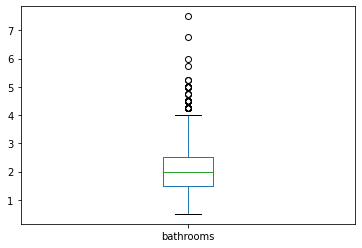

In [28]:
data.bathrooms.plot(kind ='box');

In [29]:
data.sort_values('bathrooms', ascending=False).tail(n=10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
14211,4330600360,20140617,142500.0,4,0.75,1440,13300,1.0,0.0,0.0,...,6,1440,0.0,1948,NaN,98166,47.4761,-122.337,1460,11100
12558,3095000040,20141016,315000.0,1,0.75,770,4600,1.0,0.0,0.0,...,6,770,0.0,1910,NaN,98126,47.5565,-122.377,1550,4600
9821,5381000070,20140826,204950.0,2,0.75,1130,11429,1.0,0.0,0.0,...,7,1130,0.0,1956,NaN,98188,47.4526,-122.284,1550,10700
18493,623049232,20140715,115000.0,2,0.75,550,7980,1.0,0.0,0.0,...,5,550,0.0,1952,NaN,98146,47.5110,-122.348,1330,7980
9810,3598600049,20141003,124000.0,1,0.75,840,7203,1.5,0.0,0.0,...,6,840,0.0,1949,NaN,98168,47.4756,-122.301,1560,8603
21596,1523300157,20141015,325000.0,2,0.75,1020,1076,2.0,0.0,0.0,...,7,1020,0.0,2008,0.0,98144,47.5941,-122.299,1020,1357
2259,3971701455,20141003,273000.0,2,0.50,1180,7750,1.0,0.0,0.0,...,6,590,590.0,1945,0.0,98155,47.7690,-122.316,1380,8976
11662,7987400316,20140814,255000.0,1,0.50,880,1642,1.0,0.0,0.0,...,6,500,380.0,1910,0.0,98126,47.5732,-122.372,1410,2992
12029,2991000160,20141212,312500.0,4,0.50,2300,5570,2.0,0.0,0.0,...,8,2300,?,1996,NaN,98092,47.3285,-122.168,1820,6371
10413,7129800036,20150114,109000.0,2,0.50,580,6900,1.0,0.0,0.0,...,5,580,0.0,1941,0.0,98118,47.5135,-122.262,1570,5040


In [30]:
bath8 = data.loc[data['bathrooms'] >= 8]
bath8

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15


Even there are some houses with a large amount of bathrooms, they seem to be reasonable.

## sqft_living

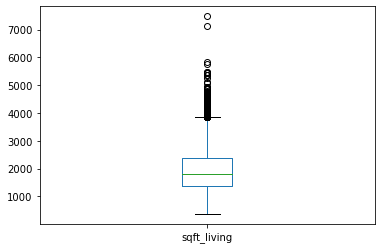

In [31]:
data.sqft_living.plot(kind='box');

The biggest available house in Hamburg has around 7500 sqft living area. In this dataset the biggest house has less than 1400 sqft. This is plausible, as houses in Hamburg are not the biggest, and the biggest house in the dataset is not even twice big.

## sqft_lot

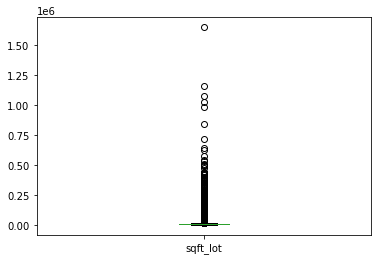

In [32]:
data.sqft_lot.plot(kind = 'box');

The biggest lot is twice big as the lot of Buckingham Palace, that's very big, but still plausible.

## floors

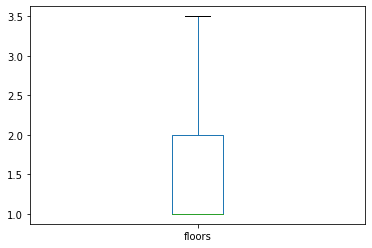

In [33]:
data.floors.plot(kind = 'box');

Everything is reasonable.

## waterfront
There are to less entries in waterfront.

In [34]:
data.waterfront.unique()

array([nan,  0.,  1.])

'nan' will be considered as 0.

In [35]:
data.waterfront.fillna(0, inplace = True)

In [36]:
data.waterfront.unique()

array([0., 1.])

## view
There are about 100 entries with a missing entry.

In [37]:
data.view.unique()

array([ 0., nan,  3.,  2.,  4.,  1.])

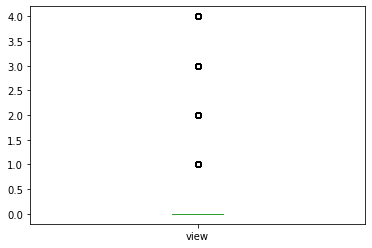

In [38]:
data.view.plot(kind ='box');

Most houses have the value zero (median). The missing fields will be replaced with 0.

In [39]:
data.view.fillna(0, inplace = True)

## condition

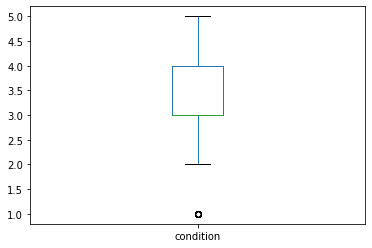

In [40]:
data.condition.plot(kind ='box');

The values are reasonable. No values are missing.

## grade

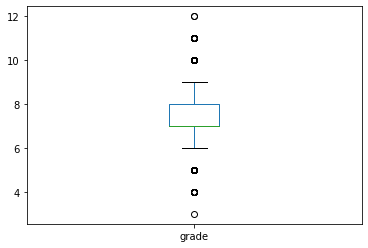

In [41]:
data.grade.plot(kind = 'box');

The values are reasonable. No values are missing.

## sqft above

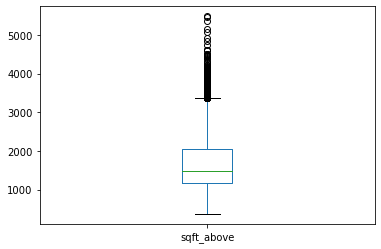

In [42]:
data.sqft_above.plot(kind = 'box');

The values are reasonable. No values are missing.

## sqft basement

In [43]:
data.sqft_basement.value_counts()

0.0       11870
?           414
600.0       205
500.0       195
700.0       185
          ...  
266.0         1
2010.0        1
1481.0        1
861.0         1
10.0          1
Name: sqft_basement, Length: 262, dtype: int64

The '?' entries will be considered as 0 sqft basement.

In [44]:
data.sqft_basement.replace('?', 0, inplace = True)

In [45]:
data.sqft_basement.value_counts()

0.0       11870
0           414
600.0       205
500.0       195
700.0       185
          ...  
248.0         1
1284.0        1
10.0          1
1135.0        1
1548.0        1
Name: sqft_basement, Length: 262, dtype: int64

In [46]:
data.sqft_basement = data.sqft_basement.astype(float)

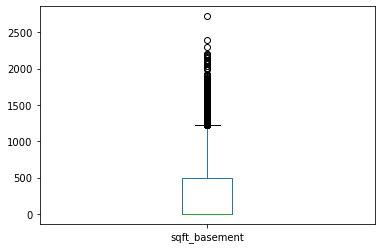

In [47]:
data.sqft_basement.plot(kind = 'box');

Around 5000sqft is a very large basement, but still possible. So the data is plausible.

## yr_built

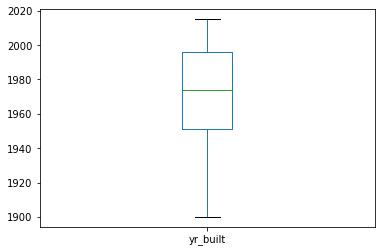

In [48]:
data.yr_built.plot(kind='box');

The data is reasonable.

## yr_renovated

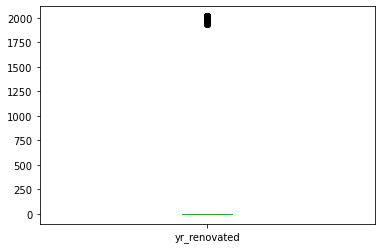

In [49]:
data.yr_renovated.plot(kind='box');

In [50]:
data.yr_renovated.value_counts()

0.0       15391
2014.0       60
2013.0       26
2007.0       21
2000.0       19
          ...  
1976.0        1
1956.0        1
1948.0        1
1953.0        1
1971.0        1
Name: yr_renovated, Length: 70, dtype: int64

In [51]:
data.yr_renovated.replace('',0,regex=True,inplace=True)

In [52]:
renovated_nonzero = data[data.yr_renovated != 0]

In [53]:
renovated_nonzero.yr_renovated.median()

1998.0

The meaning of the 0 entries will be interpreted as not renovated. This means the renovation year will be set to year builded.

In [54]:
data.yr_renovated.fillna(0, inplace = True)

In [55]:
data.yr_renovated.replace(0, data.yr_built, regex=True, inplace=True)

In [56]:
data.yr_renovated.value_counts()

2014.0    516
2005.0    425
2004.0    404
2006.0    400
1977.0    398
         ... 
1901.0     27
1902.0     24
1935.0     18
1933.0     17
1934.0     15
Name: yr_renovated, Length: 116, dtype: int64

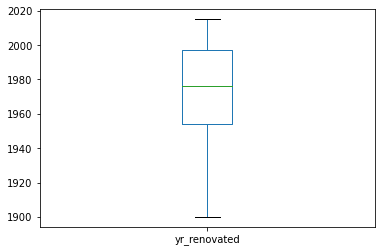

In [57]:
data.yr_renovated.plot(kind='box');

In [58]:
data.sort_values('yr_renovated', ascending=False).tail(n=10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
11127,7942602080,20140616,660000.0,6,1.75,1840,2774,1.0,0.0,0.0,...,7,1060,780.0,1900,1900.0,98122,47.6041,-122.310,1680,4292
939,2768301715,20150311,565000.0,4,3.00,2020,4300,1.5,0.0,0.0,...,6,2020,0.0,1900,1900.0,98107,47.6653,-122.372,1290,3440
19122,3388110230,20140729,179000.0,4,1.75,1790,7175,1.5,0.0,0.0,...,6,1410,380.0,1900,1900.0,98168,47.4963,-122.318,1790,8417
18901,452001540,20140818,554600.0,3,1.75,1470,5000,1.5,0.0,0.0,...,7,1470,0.0,1900,1900.0,98107,47.6755,-122.369,1530,5000
703,7011200260,20141219,485000.0,4,2.00,1400,3600,1.0,0.0,0.0,...,7,1100,300.0,1900,1900.0,98119,47.6385,-122.370,1630,2048
537,5694500105,20141204,595000.0,2,2.00,1510,4000,1.0,0.0,0.0,...,7,1010,500.0,1900,1900.0,98103,47.6582,-122.345,1920,4000
13988,2354300456,20150311,130000.0,2,1.00,600,1500,1.0,0.0,0.0,...,4,600,0.0,1900,1900.0,98027,47.5289,-122.033,1130,6000
3915,7883604065,20150501,210000.0,2,1.00,1100,6000,1.5,0.0,0.0,...,6,1100,0.0,1900,1900.0,98108,47.5275,-122.323,1280,6000
5367,3058600050,20140919,285000.0,2,1.00,920,5850,1.0,0.0,0.0,...,6,920,0.0,1900,1900.0,98108,47.5441,-122.304,1640,5476
16875,7942601435,20150324,835000.0,6,2.00,3560,5120,2.5,0.0,2.0,...,9,3560,0.0,1900,1900.0,98122,47.6056,-122.311,2130,5120


## zipcode

In [59]:
data.zipcode.unique()

array([98178, 98125, 98028, 98136, 98074, 98003, 98198, 98146, 98038,
       98007, 98115, 98107, 98126, 98019, 98103, 98002, 98133, 98092,
       98030, 98112, 98052, 98027, 98117, 98058, 98001, 98056, 98166,
       98053, 98119, 98023, 98148, 98105, 98042, 98059, 98122, 98144,
       98034, 98075, 98008, 98116, 98010, 98118, 98032, 98045, 98102,
       98077, 98108, 98168, 98177, 98065, 98029, 98006, 98109, 98022,
       98040, 98155, 98024, 98011, 98031, 98106, 98070, 98199, 98072,
       98188, 98005, 98014, 98033, 98055, 98004, 98039])

The values are reasonable. No values are missing.

## lat/long

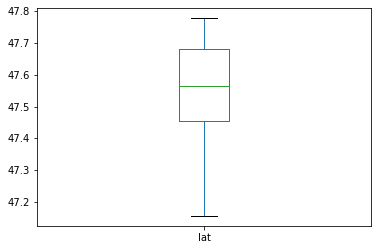

In [60]:
data.lat.plot(kind ='box');

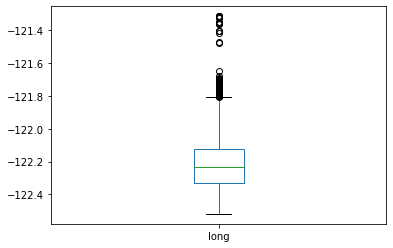

In [61]:
data.long.plot(kind='box');

The data is reasonable.

## sqft_living15

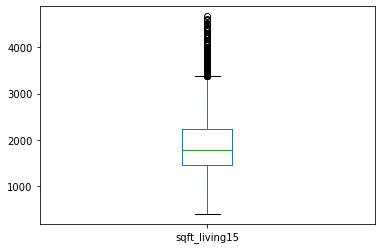

In [62]:
data.sqft_living15.plot(kind='box');

The data is reasonable.

## sqft_lot15

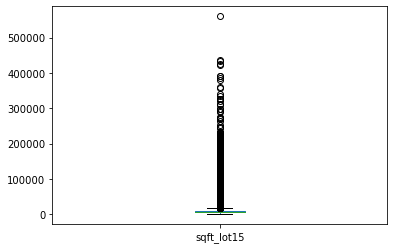

In [63]:
data.sqft_lot15.plot(kind='box');

The data is reasonable.

In [64]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19396 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             19396 non-null  int64  
 1   date           19396 non-null  int64  
 2   price          19396 non-null  float64
 3   bedrooms       19396 non-null  int64  
 4   bathrooms      19396 non-null  float64
 5   sqft_living    19396 non-null  int64  
 6   sqft_lot       19396 non-null  int64  
 7   floors         19396 non-null  float64
 8   waterfront     19396 non-null  float64
 9   view           19396 non-null  float64
 10  condition      19396 non-null  int64  
 11  grade          19396 non-null  int64  
 12  sqft_above     19396 non-null  int64  
 13  sqft_basement  19396 non-null  float64
 14  yr_built       19396 non-null  int64  
 15  yr_renovated   19396 non-null  float64
 16  zipcode        19396 non-null  int64  
 17  lat            19396 non-null  float64
 18  long  

In [65]:
data.eval('price_norm = price / sqft_lot', inplace = True)

# Correlation analysis

In [66]:
data2 = data.copy()

In [67]:
data2.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_norm
0,7129300520,20141013,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,1180,0.0,1955,1955.0,98178,47.5112,-122.257,1340,5650,39.274336
1,6414100192,20141209,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,74.288870
2,5631500400,20150225,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,770,0.0,1933,1933.0,98028,47.7379,-122.233,2720,8062,18.000000
3,2487200875,20141209,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,1050,910.0,1965,1965.0,98136,47.5208,-122.393,1360,5000,120.800000
4,1954400510,20150218,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,1680,0.0,1987,1987.0,98074,47.6168,-122.045,1800,7503,63.118812


In [68]:
data2 = data2.iloc[:,[2,3,4,5,6,7,8,9,10,11,12,13,14,15,21]]
corr = data2.corr()


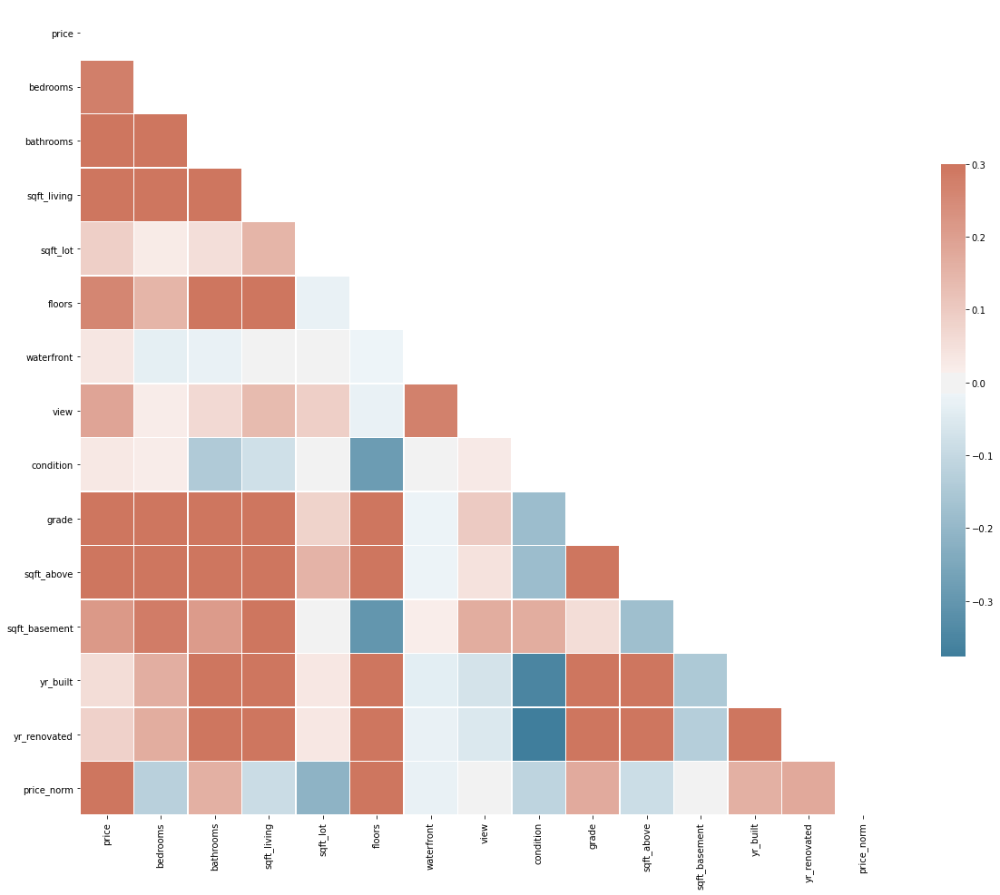

In [233]:

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

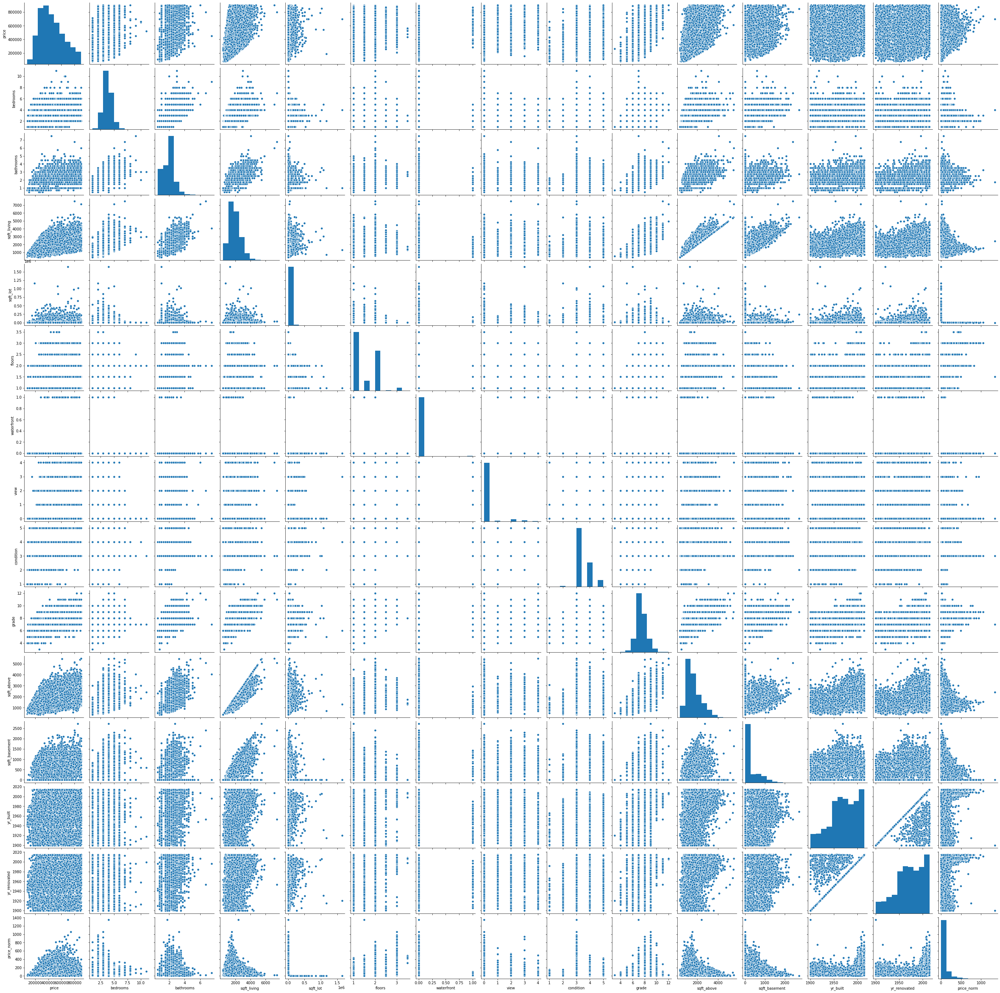

In [234]:
sns.pairplot(data2)

### Heatmaps according to location

In [69]:
import plotly.express as px
fig = px.density_mapbox(data, lat='lat', lon='long', z='price', radius=4,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.5, opacity=1, 
                        mapbox_style="open-street-map")
fig.show()

Houses with effordable prices are still available in Vashon island for example.

In [244]:
fig = px.density_mapbox(data, lat='lat', lon='long', z='price_norm', radius=4,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.5, opacity=1, 
                        mapbox_style="open-street-map")
fig.show()

If you look for a cheap price per squarefood look at east of Preston.

In [249]:
fig = px.density_mapbox(data, lat='lat', lon='long', z='sqft_living', radius=4,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.5, opacity=1, 
                        mapbox_style="open-street-map")
fig.show()

## Further Insights

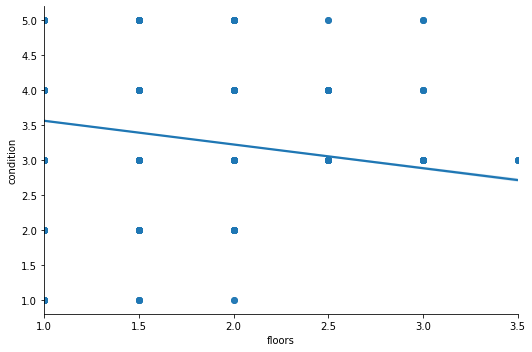

In [265]:
sns.lmplot('floors', 'condition', data=data2, aspect=1.5);

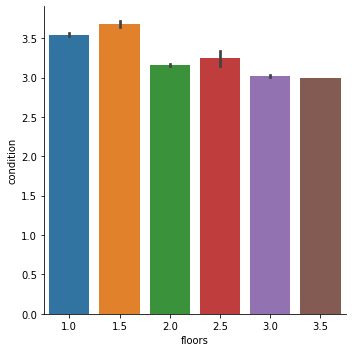

In [267]:
sns.catplot(x="floors", y="condition", kind="bar", data=data2)

It seems, that with increasing floors, the condition of the house is sinking.

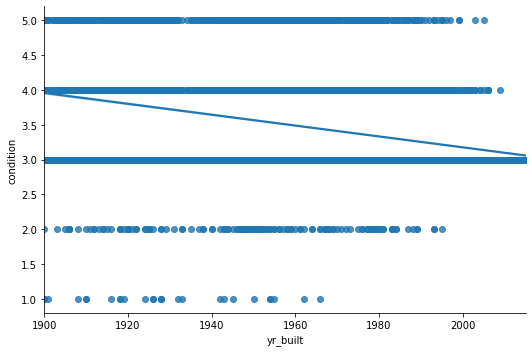

In [268]:
sns.lmplot('yr_built', 'condition', data=data2, aspect=1.5);

## Building models to predict the price

In [254]:
import statsmodels.formula.api as smf

In [252]:
explanatory_vars = list(data2.columns)
explanatory_vars = [e for e in explanatory_vars 
                        if e not in ('price','price_norm')]
explanatory_vars

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated']

In [256]:
print('R squared for each possible explanatory variable:' )
for explanatory_var in explanatory_vars:
    model = 'price_norm ~ {:}'.format(explanatory_var)
    rs = smf.ols(formula=model, data=data2).fit().rsquared
    print('{:7s} \t \t= {:.3}'.format(explanatory_var, rs))
    


R squared for each possible explanatory variable:
bedrooms 	 	= 0.0155
bathrooms 	 	= 0.0257
sqft_living 	 	= 0.00805
sqft_lot 	 	= 0.0443
floors  	 	= 0.233
waterfront 	 	= 0.000516
view    	 	= 1.84e-06
condition 	 	= 0.0131
grade   	 	= 0.0307
sqft_above 	 	= 0.00779
sqft_basement 	 	= 0.000163
yr_built 	 	= 0.0266
yr_renovated 	 	= 0.0312


In [257]:
print('R squared for each possible explanatory variable:' )
for explanatory_var in explanatory_vars:
    model = 'price ~ {:}'.format(explanatory_var)
    rs = smf.ols(formula=model, data=data2).fit().rsquared
    print('{:7s} \t \t= {:.3}'.format(explanatory_var, rs))

R squared for each possible explanatory variable:
bedrooms 	 	= 0.0776
bathrooms 	 	= 0.174
sqft_living 	 	= 0.332
sqft_lot 	 	= 0.00813
floors  	 	= 0.0666
waterfront 	 	= 0.00128
view    	 	= 0.0357
condition 	 	= 0.000947
grade   	 	= 0.349
sqft_above 	 	= 0.235
sqft_basement 	 	= 0.046
yr_built 	 	= 0.00331
yr_renovated 	 	= 0.0073


# The 'R squared'-Values are pretty low for a prediction model!

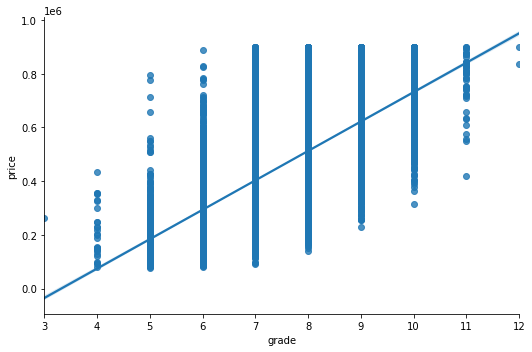

In [259]:
sns.lmplot('grade', 'price', data=data2, aspect=1.5);

In [260]:
smf.ols(formula='price ~ grade', data=data2).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.349
Model:                            OLS   Adj. R-squared:                  0.349
Method:                 Least Squares   F-statistic:                 1.042e+04
Date:                Mon, 21 Sep 2020   Prob (F-statistic):               0.00
Time:                        00:51:03   Log-Likelihood:            -2.5813e+05
No. Observations:               19396   AIC:                         5.163e+05
Df Residuals:                   19394   BIC:                         5.163e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -3.64e+05   8082.364    -45.041      0.000    -3.8e+05   -3.48e+05
grade       1.096e+05   1073.538    102.060      0.000    1.07e+05    1.12e+05
==============================================================================
Omnibus:                      682.393   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              755.015
Skew:                           0.481   Prob(JB):                    1.12e-164
Kurtosis:                       2.915   Cond. No.                         59.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

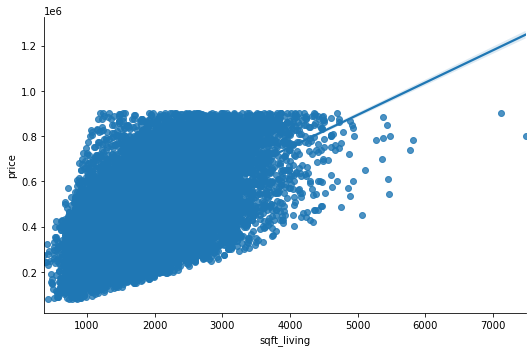

In [261]:
sns.lmplot('sqft_living', 'price', data=data2, aspect=1.5);

In [262]:
smf.ols(formula='price ~ sqft_living', data=data2).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.332
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     9623.
Date:                Mon, 21 Sep 2020   Prob (F-statistic):               0.00
Time:                        00:54:19   Log-Likelihood:            -2.5839e+05
No. Observations:               19396   AIC:                         5.168e+05
Df Residuals:                   19394   BIC:                         5.168e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    1.788e+05   2997.860     59.657      0.000    1.73e+05    1.85e+05
sqft_living   142.9276      1.457     98.098      0.000     140.072     145.783
==============================================================================
Omnibus:                      611.945   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              620.593
Skew:                           0.410   Prob(JB):                    1.74e-135
Kurtosis:                       2.691   Cond. No.                     5.82e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.82e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [264]:
smf.ols(formula='price ~ sqft_living + grade + bathrooms + bedrooms', data=data2).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.411
Model:                            OLS   Adj. R-squared:                  0.411
Method:                 Least Squares   F-statistic:                     3378.
Date:                Mon, 21 Sep 2020   Prob (F-statistic):               0.00
Time:                        00:58:38   Log-Likelihood:            -2.5717e+05
No. Observations:               19396   AIC:                         5.144e+05
Df Residuals:                   19391   BIC:                         5.144e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1.904e+05   9399.123    -20.260      0.000   -2.09e+05   -1.72e+05
sqft_living    97.4670      2.414     40.380      0.000      92.736     102.198
grade        6.976e+04   1451.397     48.063      0.000    6.69e+04    7.26e+04
bathrooms   -1.531e+04   2114.783     -7.242      0.000   -1.95e+04   -1.12e+04
bedrooms        -1e+04   1469.663     -6.806      0.000   -1.29e+04   -7122.036
==============================================================================
Omnibus:                      616.325   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              676.550
Skew:                           0.457   Prob(JB):                    1.23e-147
Kurtosis:                       2.966   Cond. No.                     1.97e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.97e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""